In [1]:
%load_ext autoreload
%autoreload 2

#standard imports
import numpy as np
import pandas as pd
import numpy as np
import datetime
import pandas as pd
import matplotlib.pyplot as plt
import sys
import warnings
warnings.filterwarnings('ignore')
sys.path.append("..")

#rl book imports
import rl
from rl.markov_decision_process import MarkovDecisionProcess
from rl.markov_process import State, MarkovProcess, NonTerminal, Terminal

from typing import (Callable, Dict, Generic, Iterator, Iterable, List,
                    Mapping, Optional, Sequence, Tuple, TypeVar, overload)


from rl.distribution import Categorical, Distribution, Constant, Choose
from rl.policy import Policy
from rl.monte_carlo import epsilon_greedy_policy, greedy_policy_from_qvf, glie_mc_control, mc_prediction
from rl.function_approx import LinearFunctionApprox, AdamGradient
from rl.td import glie_sarsa, q_learning
from rl.td_lambda import td_lambda_prediction


#custom imports 
import utils as u
import data as dat
import mdp_agent as ag
import baseline_policies as bp
import q_plots as qp
import backtest as btest
import v_plots as vp

from v_plots import VAnalyzer

#  Predict V for OU

In [2]:
mu=100
sigma = 10
train, test = dat.build_simulated_train_test(N=10,mu=mu,sigma=sigma,kappa=10)
u.plot_plotly_multiple(train)

In [3]:
u.plot_plotly(test)

# Get trader

In [4]:
trader = ag.Trading(train,test,lookback=0)
mrp_buy = trader.apply_policy(bp.BuyAndHold())

# Create features functions

In [5]:
ffs = [
    lambda x : 1,
    lambda x : x.state["Spot"]
]

approx_0 = LinearFunctionApprox.create(feature_functions=ffs)

# MC Prediction

In [6]:
initial_state = trader.generate_start_state("train")
traces = mrp_buy.reward_traces(initial_state)

vfs_mc = mc_prediction(
    traces,
    approx_0,
    0.9,
    1e-6
)

num_iter = 10

final_v_mc = None

for i,vf in enumerate(vfs_mc):
    if i>=num_iter:
        break

    if i % 2 == 0:
        print(f"i={i}")

    final_v_mc = vf


print("=== weights ===")
print(final_v_mc.weights.weights)

i=0
i=2
i=4
i=6
i=8
=== weights ===
[ 3.36671116e-04 -3.42265090e-05]


In [8]:
mu=100
sigma = 30
train, test = dat.build_simulated_train_test(N=10,mu=mu,sigma=sigma)

trader = ag.Trading(train,test)
threshold_policy = bp.ThresholdTradingPolicy(enter_long = mu-0.3*sigma, exit_long=mu-0.05*sigma, enter_short = mu+0.3*sigma, exit_short = mu+0.05*sigma)

states_arr = []
start_states = trader.generate_start_state('test')
sequence = trader.simulate_actions(start_states, threshold_policy)

for x in sequence:
    states_arr.append(x.state)

In [12]:
print(type(states_arr[0]))

<class 'rl.markov_process.NonTerminal'>


In [21]:
# def vfunc(state):
#     date_str = state.state["date"]
#     print(date_str)
#     t = datetime.datetime.strptime(date_str, '%Y-%m-%d')
#     lookback = state.state["lookback"]
#     start_date = t - datetime.timedelta(days=lookback)
#     spot = state.state["Spot"]
#     mu = np.mean(state.state["data"][start_date:t])
#     sigma = np.std(state.state["data"][start_date:t])

#     return (spot - mu) / sigma

def vfunc(state):
    t = state.state["date"]
    lookback = state.state["lookback"]
    start_date = t - datetime.timedelta(days=lookback)
    spot = state.state["Spot"]
    mu = np.mean(state.state["data"][start_date:t])
    sigma = np.std(state.state["data"][start_date:t])

    return (spot - mu) / sigma

In [22]:
# spot_range = np.arange(100-20,100+20,0.01)

# state_dicts =  [NonTerminal({
#             "Spot" : s,
#             "position" : 1,
#             "date" : "2020-01-01",
#             "data" : test,
#             "lookback": 100,
#             "time index": 0
#         }) for s in spot_range]

vvf = vfunc
# state_dicts = state_dicts
vanalyzer = vp.VAnalyzer(vvf,states_arr)

In [23]:
vanalyzer.createHeatMap()

Completed iteration 100 of 1273
Completed iteration 200 of 1273
Completed iteration 300 of 1273
Completed iteration 400 of 1273
Completed iteration 500 of 1273
Heatmap creation complete
Heatmap layout complete


Heatmap shown


In [9]:
print(states_arr[0].state['Spot'])

# spot_prices = []
# xdates = []

# for s in states_arr[0:500]:
#     xdates.append(states_arr["date"])
#     spot_prices.append(states_arr["Spot"])

# print(xdates)

89.08113176939685


## TD lambda

In [71]:
vfs_td_lambda = td_lambda_prediction(
        traces,
        approx_0,
        0.9,
        0.8
)

num_iter = 100000

final_v_td_l = None

for i,vf in enumerate(vfs_td_lambda):
    if i>=num_iter:
        break 

    final_v_td_l = vf

KeyboardInterrupt: 

# Retained v

In [10]:
v_feat = final_v_mc

# new v function

In [18]:
def vfunc(state):
    date_str = state.state["date"]
    t = datetime.datetime.strptime(date_str, '%Y-%m-%d')
    lookback = state.state["lookback"]
    start_date = t - datetime.timedelta(days=lookback)
    spot = state.state["Spot"]
    mu = np.mean(state.state["data"][start_date:t])
    sigma = np.std(state.state["data"][start_date:t])

    return (spot - mu) / sigma

## dirty code to quickly plot V

In [19]:
# use heatmap to plot the value function
spot_range = np.arange(100-20,100+20,0.01)

state_dicts =  [NonTerminal({
            "Spot" : s,
            "position" : 1,
            "date" : "2020-01-01",
            "data" : test,
            "lookback": 100,
            "time index": 0
        }) for s in spot_range]

vvf = vfunc
state_dicts = state_dicts
vanalyzer = vp.VAnalyzer(vvf,state_dicts)

In [23]:
# plot spot price against date
spot_prices = []
xdates = []
for state_dict in state_dicts[0:500]:
    xdates.append(state_dict.state["date"])
    spot_prices.append(state_dict.state["Spot"])

print(xdates)

['2020-01-01', '2020-01-01', '2020-01-01', '2020-01-01', '2020-01-01', '2020-01-01', '2020-01-01', '2020-01-01', '2020-01-01', '2020-01-01', '2020-01-01', '2020-01-01', '2020-01-01', '2020-01-01', '2020-01-01', '2020-01-01', '2020-01-01', '2020-01-01', '2020-01-01', '2020-01-01', '2020-01-01', '2020-01-01', '2020-01-01', '2020-01-01', '2020-01-01', '2020-01-01', '2020-01-01', '2020-01-01', '2020-01-01', '2020-01-01', '2020-01-01', '2020-01-01', '2020-01-01', '2020-01-01', '2020-01-01', '2020-01-01', '2020-01-01', '2020-01-01', '2020-01-01', '2020-01-01', '2020-01-01', '2020-01-01', '2020-01-01', '2020-01-01', '2020-01-01', '2020-01-01', '2020-01-01', '2020-01-01', '2020-01-01', '2020-01-01', '2020-01-01', '2020-01-01', '2020-01-01', '2020-01-01', '2020-01-01', '2020-01-01', '2020-01-01', '2020-01-01', '2020-01-01', '2020-01-01', '2020-01-01', '2020-01-01', '2020-01-01', '2020-01-01', '2020-01-01', '2020-01-01', '2020-01-01', '2020-01-01', '2020-01-01', '2020-01-01', '2020-01-01', '2020

In [20]:
vanalyzer.createHeatMap()

Completed iteration 100 of 4000
Completed iteration 200 of 4000
Completed iteration 300 of 4000
Completed iteration 400 of 4000
Completed iteration 500 of 4000
Heatmap creation complete
Heatmap layout complete


Heatmap shown


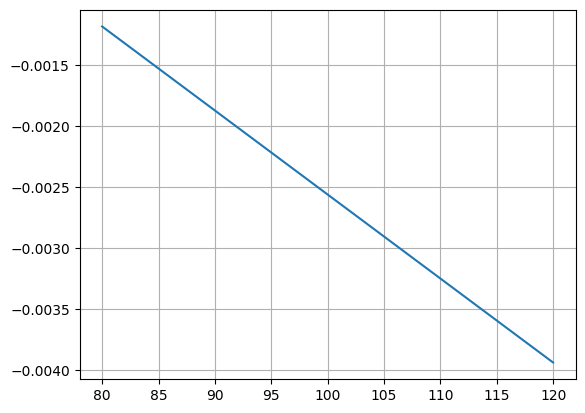

In [23]:
spot_range = np.arange(100-20,100+20,0.01)

state_dicts =  [NonTerminal({
            "Spot" : s,
            "position" : 1,
            "date" : "2020-01-01",
            "data" : test,
            "lookback": 100,
            "time index": 0
        }) for s in spot_range]

plt.plot(spot_range,[v_feat(s) for s in state_dicts])
plt.grid()

# Now that we have V, include it as feature

In [88]:
trader = ag.Trading(train,test,lookback=100)

ffs = [

    lambda x: 1 if ((x[0].state["position"]==0)and (x[1] == -1 )) else 0,
    lambda x: 1 if ((x[0].state["position"]==0)and (x[1] == 0 )) else 0,
    lambda x: 1 if ((x[0].state["position"]==0)and (x[1] == 1 )) else 0,

    lambda x: 1 if ((x[0].state["position"]==1)and (x[1] == -1 )) else 0,
    lambda x: 1 if ((x[0].state["position"]==1)and (x[1] == 0 )) else 0,

    lambda x: 1 if ((x[0].state["position"]==-1)and (x[1] == 0 )) else 0,
    lambda x: 1 if ((x[0].state["position"]==-1)and (x[1] == 1 )) else 0,

    lambda x:  v_feat(x[0]) if ((x[0].state["position"]==0)and (x[1] == -1 )) else 0,
    lambda x:  v_feat(x[0]) if ((x[0].state["position"]==0)and (x[1] == 0 )) else 0,
    lambda x:  v_feat(x[0]) if ((x[0].state["position"]==0)and (x[1] == 1 )) else 0,

    lambda x:  v_feat(x[0]) if ((x[0].state["position"]==1)and (x[1] == -1 )) else 0,
    lambda x:  v_feat(x[0]) if ((x[0].state["position"]==1)and (x[1] == 0 )) else 0,

    lambda x:  v_feat(x[0]) if ((x[0].state["position"]==-1)and (x[1] == 0 )) else 0,
    lambda x:  v_feat(x[0]) if ((x[0].state["position"]==-1)and (x[1] == 1 )) else 0,
  
]

q_approx = LinearFunctionApprox.create(feature_functions=ffs)


In [89]:
qvfs_mc = glie_mc_control(
    trader,
    trader.generate_start_state("train"),
    q_approx,
    0.5,
    lambda k: 1/k
)

In [90]:
num_iter = 10
final_qvf = None
for i,qvf in enumerate(qvfs_mc):
    if i%100==0:
        print(i)
    if i>=num_iter:
        break
    final_qvf = qvf

0


In [91]:
qanalysis = qp.QAnalyzer(test,final_qvf)
qanalysis.plot_snapshot(trader.generate_start_state("train").sample())

In [92]:
trading_policy  = greedy_policy_from_qvf(final_qvf, lambda x : [-1,0,1])
bt = btest.Backtester(trader,trading_policy)
bt.summary()

/Users/mehdi/Desktop/cme241/RL_Project/utils.py:96: FutureWarning:

Argument `closed` is deprecated in favor of `inclusive`.

